In [1]:
import cv2
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
test_images_path = [path for path in glob.glob('./test_images/*.jpg')]

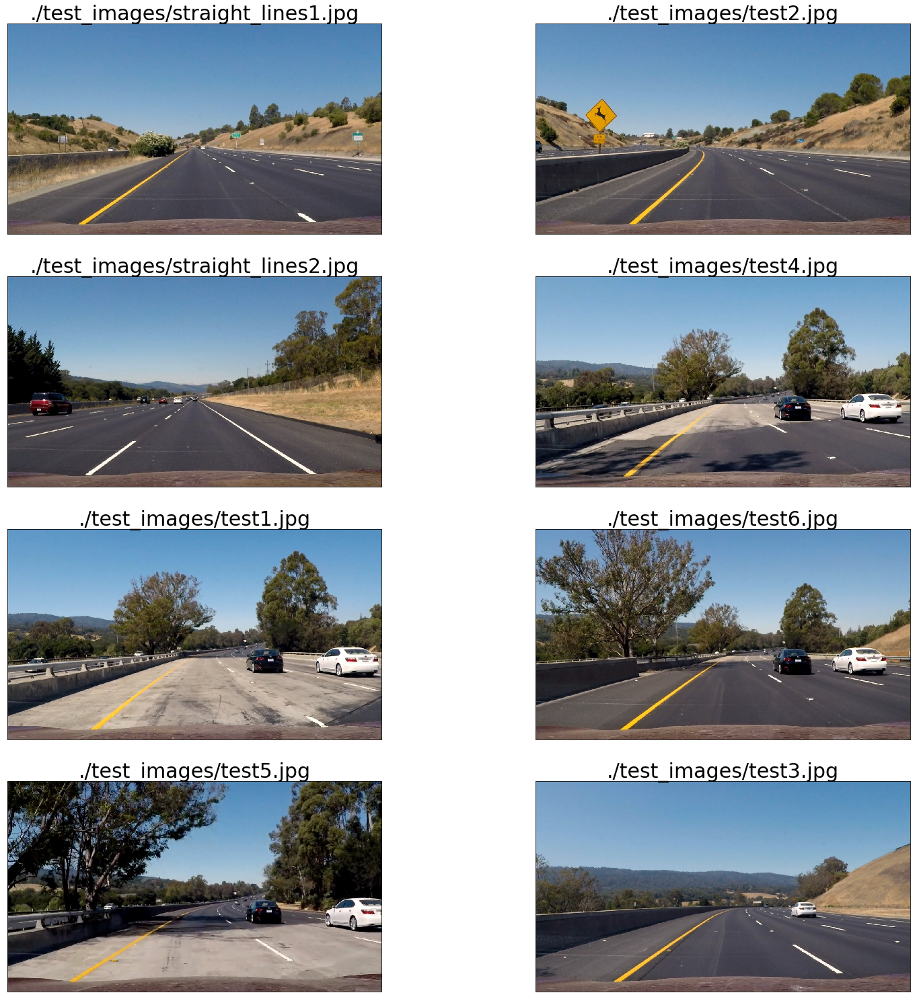

In [3]:
fig, axes = plt.subplots(4, 2, figsize=(20, 20))
axes = axes.flatten()
for index, path in enumerate(test_images_path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    axes[index].imshow(img)
    axes[index].set_title(path, fontsize=30)
    axes[index].set_xticks([])
    axes[index].set_yticks([])
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)

# 2. undistort image

In [4]:
with open('experimental/data.pickle', 'rb') as f:
    data = pickle.load(f)

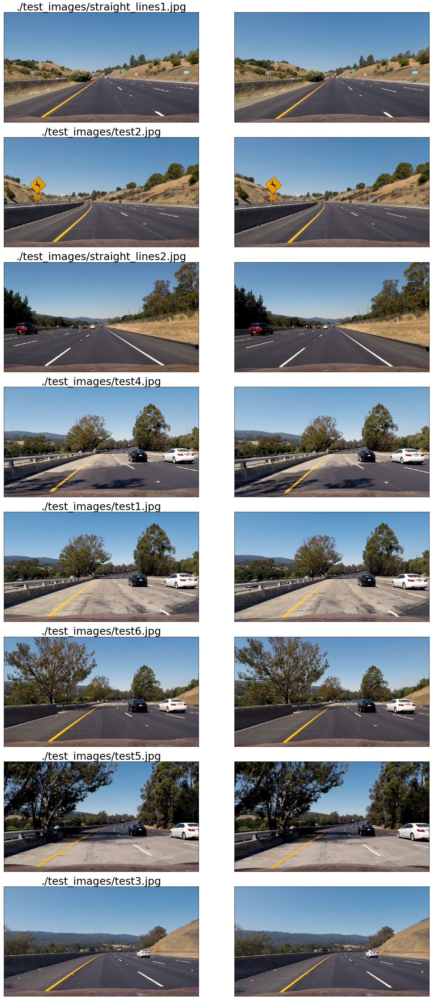

In [5]:
fig, axes = plt.subplots(8, 2, figsize=(20, 40))
for index, path in enumerate(test_images_path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    dst = cv2.undistort(img, data['mtx'], data['dist'], None, data['newcameramtx'])
    
    axes[index, 0].imshow(img)
    axes[index, 0].set_xticks([])
    axes[index, 0].set_yticks([])
    axes[index, 0].set_title(path, fontsize=30)
    axes[index, 1].imshow(dst)
    axes[index, 1].set_xticks([])
    axes[index, 1].set_yticks([])
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    
    
fig.tight_layout()

# 3. Sobel Filter

In [6]:
sample_img = cv2.imread('./test_images/test4.jpg')
sample_img_hls = cv2.cvtColor(sample_img, cv2.COLOR_BGR2HLS)
sample_img_gray = cv2.cvtColor(sample_img, cv2.COLOR_BGR2GRAY)

In [7]:
sobelx = cv2.Sobel(sample_img_gray, cv2.CV_64F, 1, 0)
sobely = cv2.Sobel(sample_img_gray, cv2.CV_64F, 0, 1)

In [8]:
abs_sobelx = np.absolute(sobelx)
abs_sobely = np.absolute(sobely)

In [9]:
scaled_sobelx = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
scaled_sobely = np.uint8(255 * abs_sobely / np.max(abs_sobely))

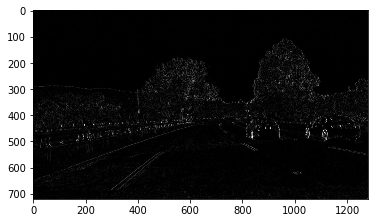

In [10]:
plt.imshow(scaled_sobelx, cmap='gray')

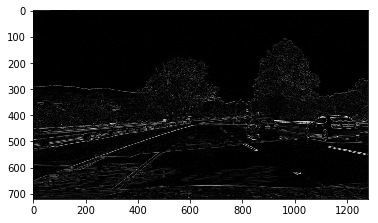

In [11]:
plt.imshow(scaled_sobely, cmap='gray')

In [12]:
thresh_min = 20
thresh_max = 100

In [13]:
sxbinary = np.zeros_like(scaled_sobelx)
sxbinary[(scaled_sobelx >= thresh_min) & (scaled_sobelx <= thresh_max)] = 1

In [14]:
sybinary = np.zeros_like(scaled_sobely)
sybinary[(scaled_sobely >= thresh_min) & (scaled_sobely <= thresh_max)] = 1

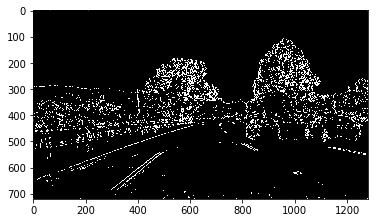

In [15]:
plt.imshow(sxbinary, cmap='gray')

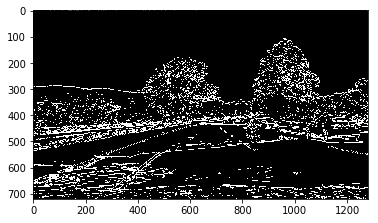

In [16]:
plt.imshow(sybinary, cmap='gray')

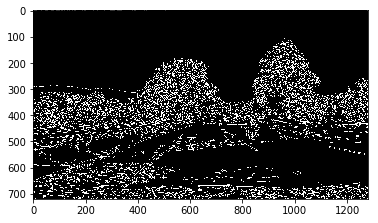

In [17]:
canny = cv2.Canny(sample_img_gray, 20, 100)
plt.imshow(canny, cmap='gray')

In [18]:
from IPython.display import Image, display
from ipywidgets import widgets, interact, IntSlider

In [21]:
# パラメータ thresh を設定するスライダー
slider_min = widgets.IntSlider(
    min=0, max=255, step=1, value=0, description="thresh_min: ")
slider_min.layout.width = "400px"

In [22]:
# パラメータ thresh を設定するスライダー
slider_max = widgets.IntSlider(
    min=0, max=255, step=1, value=0, description="thresh_max: ")
slider_max.layout.width = "400px"

In [32]:
@interact(thresh_min=slider_min, thresh_max=slider_max)
def threshold(thresh_min, thresh_max):
    binary = np.zeros_like(scaled_sobelx)
    print('min: {}, max: {}'.format(thresh_min, thresh_max))
    binary[(scaled_sobelx >= thresh_min) & (scaled_sobelx <= thresh_max)] = 1
    plt.imshow(binary, cmap='gray')

interactive(children=(IntSlider(value=0, description='thresh_min: ', layout=Layout(width='400px'), max=255), IntSlider(value=248, description='thresh_max: ', layout=Layout(width='400px'), max=255), Output()), _dom_classes=('widget-interact',))

(sobel filter for x axis) best thresh min = 25

In [33]:
@interact(thresh_min=slider_min, thresh_max=slider_max)
def threshold(thresh_min, thresh_max):
    binary = np.zeros_like(scaled_sobely)
    print('min: {}, max: {}'.format(thresh_min, thresh_max))
    binary[(scaled_sobely >= thresh_min) & (scaled_sobely <= thresh_max)] = 1
    plt.imshow(binary, cmap='gray')

interactive(children=(IntSlider(value=27, description='thresh_min: ', layout=Layout(width='400px'), max=255), IntSlider(value=142, description='thresh_max: ', layout=Layout(width='400px'), max=255), Output()), _dom_classes=('widget-interact',))

(sobel filter for y axis) best thresh min = 40

# 4. Gradients Magnitude

In [34]:
gradmag = np.sqrt(sobelx**2 + sobely**2)

In [37]:
scale_factor = np.max(gradmag) / 255
scale_factor

3.5568649069323479

In [38]:
gradmag = (gradmag / scale_factor).astype(np.uint8)

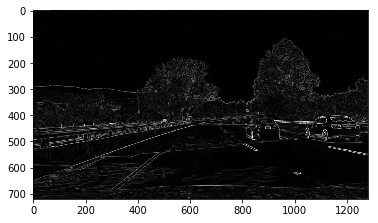

In [40]:
binary_out = np.zeros_like(gradmag)
binary_out[(gradmag >= 25) & (gradmag <= 200)] = 1
plt.imshow(gradmag, cmap='gray')

# 5. direction of Gradients

In [41]:
absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))

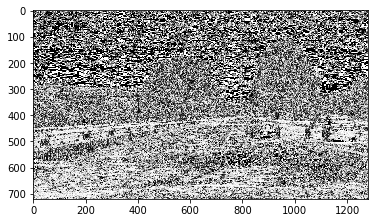

In [43]:
binary_out = np.zeros_like(absgraddir)
binary_out[(absgraddir >= 0.7) & (absgraddir <= 1.3)] = 1
plt.imshow(absgraddir, cmap='gray')

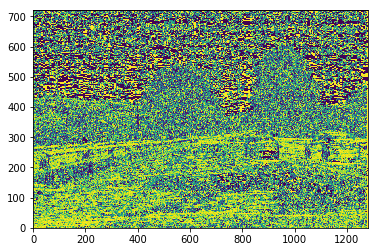

In [51]:
plt.pcolor(absgraddir[::-1, :])

# 6. Color Gradients

In [52]:
sample_img_hls.shape

(720, 1280, 3)

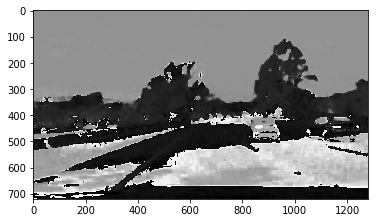

In [53]:
plt.imshow(sample_img_hls[:, :, 0], cmap='gray')

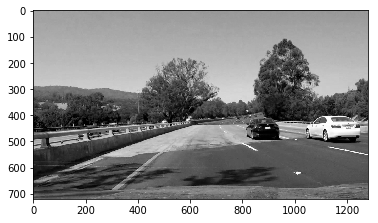

In [54]:
plt.imshow(sample_img_hls[:, :, 1], cmap='gray')

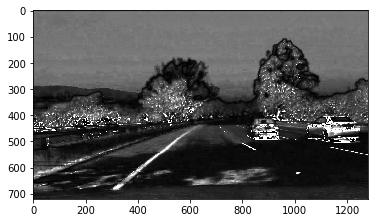

In [55]:
plt.imshow(sample_img_hls[:, :, 2], cmap='gray')

In [56]:
s_channel = sample_img_hls[:, :, 2]

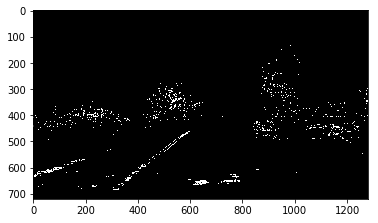

In [64]:
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= 140) & (s_channel <= 200)] = 1
plt.imshow(s_binary, cmap='gray')